In [2]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import traceback
import re
import string
import pandas.core.algorithms as algos
from pandas import Series
import os
import datetime as dt
import matplotlib as matplot
import seaborn as sns
import matplotlib.pyplot as plt
from dateutil import relativedelta
#!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library
#!pip install seaborn
#!conda install -c anaconda seaborn=0.9.0

In [628]:
### Desde nuestro github público consumimos el archivo csv originas
df=pd.read_csv('https://raw.githubusercontent.com/poncho6296/Modelo_Hackathon/main/data/ubicaciones.csv')

In [630]:
df['Multiple']=np.where(df['Frecuencia']==1, 0, 1)

In [631]:
df.head()

,Id_Cliente,id_Agencia,Frecuencia,Vol_Entrega,lat,lon,Vol_total,D1,D2,D3,D4,D5,D6,Multiple
0,1,A1,1,2.0,20.506052,-98.212377,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0
1,2,A1,1,17.0,20.458128,-98.221248,17.0,0.0,0.0,0.0,1.0,0.0,0.0,0
2,3,A1,1,2.0,20.530427,-98.236860,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,4,A1,3,15.0,20.488655,-98.202940,45.0,1.0,0.0,0.0,1.0,0.0,1.0,1
4,5,A1,1,2.0,20.533253,-98.219669,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [632]:
X=df[['lat','lon']].values

In [417]:
def initialize_centroids(points, k):
    """returns k centroids from the initial points"""
    centroids = points.copy()
    np.random.shuffle(centroids)
    return centroids[:k]

In [418]:
initial=initialize_centroids(X, 6)
initial

array([[ 20.471395, -98.220382],
       [ 20.53056 , -98.174447],
       [ 20.504504, -98.233748],
       [ 20.438249, -98.159356],
       [ 20.482415, -98.170642],
       [ 20.49743 , -98.145606]])

In [419]:
f=df['Frecuencia'].values

In [420]:
def estep(X:np.ndarray,centroid:np.ndarray,frecuencia=0):
    """E-step: Assigns each datapoint to the gaussian component with the
    closest mean

    Args:
        X: (n, d) array holding the data
        mixture: the current gaussian mixture

    Returns:
        np.ndarray: (n, K) array holding the soft counts
            for all components for all examples

        """
    n,_=X.shape
    K,_= centroid.shape
    post = np.zeros((n, K))
    

    for i in range(n):
        freq=frecuencia[i]
        tiled_vector = np.tile(X[i, :], (K, 1))
        sse = ((tiled_vector - centroid)**2).sum(axis=1)
        if freq==1:
            j = np.argmin(sse)
            post[i, j] = 1
        else:
            for k in range (freq):
                j=np.argmin(sse)
                post[i,j]=1
                sse[j]=1e6

    return post



In [421]:
post=estep(X,initial,f)
post[3]

array([1., 0., 1., 0., 1., 0.])

In [422]:
def mstep(X: np.ndarray, post: np.ndarray):
    """M-step: Updates the gaussian mixture. Each cluster
    yields a component mean and variance.

    Args: X: (n, d) array holding the data
        post: (n, K) array holding the soft counts
            for all components for all examples

    Returns:
        GaussianMixture: the new gaussian mixture
        float: the distortion cost for the current assignment
    """
    n, d = X.shape
    _, K = post.shape
    

    n_hat = post.sum(axis=0)
    p = n_hat / n

    cost = 0
    centroid = np.zeros((K, d))
    
    for j in range(K):
        centroid[j, :] = post[:, j] @X / n_hat[j]
        sse = ((centroid[j] - X)**2).sum(axis=1) @ post[:, j]
        cost += sse
    return centroid, cost

In [423]:
mstep(X,post)

(array([[ 20.47121878, -98.23608404],
        [ 20.54407284, -98.16644112],
        [ 20.5084252 , -98.23935267],
        [ 20.45313596, -98.16135414],
        [ 20.48133753, -98.1750503 ],
        [ 20.50394359, -98.14269183]]),
 3.465038574461319)

In [424]:
def run(X=0, centroid=0,frecuencia=0):
    """Runs the mixture model

    Args:
        X: (n, d) array holding the data
        post: (n, K) array holding the soft counts
            for all components for all examples

    Returns:
        GaussianMixture: the new gaussian mixture
        np.ndarray: (n, K) array holding the soft counts
            for all components for all examples
        float: distortion cost of the current assignment
    """

    prev_cost = None
    cost = None
    while (prev_cost is None or prev_cost - cost > 1e-10):
        prev_cost = cost
        post = estep(X, centroid,frecuencia)
        centroid, cost = mstep(X, post)

    return centroid, post, cost

In [425]:
centroid,post,cost=run(X,initial,f)

In [426]:
df['Cluster']=np.argmax(post,axis=1)
map_Zonas = folium.Map(location=[20.506052, -98.212377], zoom_start=12)
markers_colors = []
i=0
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
for lat, lon, cluster in zip(df['lat'], df['lon'],df['Cluster']):
    
    #i=i+1
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Zonas)
    #if i==6:
        #break
map_Zonas

In [427]:
import matplotlib.cm as cm
import matplotlib.colors as colors
map_Zonas = folium.Map(location=[20.506052, -98.212377], zoom_start=12)
markers_colors = []
i=0
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
for lat, lon, cluster in zip(df['lat'], df['lon'],df['Cluster']):
    
    #i=i+1
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Zonas)
    #if i==6:
        #break
map_Zonas

In [428]:
df[['Cluster','Vol_Entrega']].groupby(['Cluster']).sum()

,Vol_Entrega
Cluster,
0,9102.166667
1,8868.500000
2,7186.000000
3,9050.833333
4,8348.000000
5,5279.000000


In [429]:
df[['Cluster','Vol_Entrega']].groupby(['Cluster']).count()

,Vol_Entrega
Cluster,
0,639
1,735
2,628
3,651
4,525
5,447


In [430]:
df['Cluster']=np.argmax(post,axis=1)

In [431]:
df['Cluster_1']=post[:,0]
df['Cluster_2']=post[:,1]
df['Cluster_3']=post[:,2]
df['Cluster_4']=post[:,3]
df['Cluster_5']=post[:,4]
df['Cluster_6']=post[:,5]

In [432]:
df.head()

,Id_Cliente,id_Agencia,Frecuencia,Vol_Entrega,lat,lon,Multiple,Cluster,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6
0,1,A1,1,2.0,20.506052,-98.212377,0,4,0.0,0.0,0.0,0.0,1.0,0.0
1,2,A1,1,17.0,20.458128,-98.221248,0,4,0.0,0.0,0.0,0.0,1.0,0.0
2,3,A1,1,2.0,20.530427,-98.236860,0,2,0.0,0.0,1.0,0.0,0.0,0.0
3,4,A1,3,15.0,20.488655,-98.202940,1,2,0.0,0.0,1.0,1.0,1.0,0.0
4,5,A1,1,2.0,20.533253,-98.219669,0,2,0.0,0.0,1.0,0.0,0.0,0.0


In [433]:
Zonas=df.melt(id_vars=['Id_Cliente', 'id_Agencia', 'Frecuencia', 'Vol_Entrega', 'lat', 'lon',
       'Multiple', 'Cluster'], 
        var_name="Agrupación", 
        value_name="Value")
Zonas=Zonas[Zonas['Value']!=0]
Zonas[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).sum()

,Vol_Entrega
Agrupación,
Cluster_1,9102.166667
Cluster_2,8868.500000
Cluster_3,7500.500000
Cluster_4,9091.500000
Cluster_5,12093.000000
Cluster_6,7744.333333


In [435]:
Zonas[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).count()

,Vol_Entrega
Agrupación,
Cluster_1,639
Cluster_2,735
Cluster_3,655
Cluster_4,654
Cluster_5,718
Cluster_6,576


In [436]:
X=df[['lat','lon','Vol_Entrega']]
X['Vol_Entrega']=X['Vol_Entrega']/np.max(df['Vol_Entrega'])
X=X.values
initial=initialize_centroids(X, 6)
centroid,post,cost=run(X,initial,f)
df['Cluster']=np.argmax(post,axis=1)
map_Zonas = folium.Map(location=[20.506052, -98.212377], zoom_start=12)
markers_colors = []
i=0
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
for lat, lon, cluster in zip(df['lat'], df['lon'],df['Cluster']):
    
    #i=i+1
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Zonas)
    #if i==6:
        #break
map_Zonas

<ipython-input-436-dceeaeb74375>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Vol_Entrega']=X['Vol_Entrega']/np.max(df['Vol_Entrega'])


In [440]:
df['Cluster_1']=post[:,0]
df['Cluster_2']=post[:,1]
df['Cluster_3']=post[:,2]
df['Cluster_4']=post[:,3]
df['Cluster_5']=post[:,4]
df['Cluster_6']=post[:,5]
Zonas=df.melt(id_vars=['Id_Cliente', 'id_Agencia', 'Frecuencia', 'Vol_Entrega', 'lat', 'lon',
       'Multiple', 'Cluster'], 
        var_name="Agrupación", 
        value_name="Value")
Zonas=Zonas[Zonas['Value']!=0]
print(Zonas[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).sum())
print(Zonas[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).count())

             Vol_Entrega
Agrupación              
Cluster_1   11428.500000
Cluster_2    7664.000000
Cluster_3    9346.000000
Cluster_4    5918.333333
Cluster_5   14592.166667
Cluster_6    5451.000000
            Vol_Entrega
Agrupación             
Cluster_1           215
Cluster_2          1002
Cluster_3            88
Cluster_4          1151
Cluster_5           575
Cluster_6           946


In [254]:
from scipy.cluster.vq import vq, kmeans2, whiten
import matplotlib.pyplot as plt
centroid,label=kmeans2(X,6)
df['Cluster']=label

In [257]:
map_Zonas = folium.Map(location=[20.506052, -98.212377], zoom_start=12)
markers_colors = []
i=0
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
for lat, lon, cluster in zip(df['lat'], df['lon'],df['Cluster']):
    
    #i=i+1
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Zonas)
    #if i==6:
        #break
map_Zonas

In [361]:
!pip install balanced-kmeans

  Created wheel for balanced-kmeans: filename=balanced_kmeans-0.1.0-py3-none-any.whl size=5172 sha256=cf17b97c3771be0c365de374a3a5e29cbdc7439bd02cac3d4c0b700abf13fa6f
  Stored in directory: c:\users\jose juarez\appdata\local\pip\cache\wheels\21\f0\a8\74a325b8bc9b1192975f913da036cf84855d7688124f6d1bab
Successfully built balanced-kmeans


In [705]:
import torch
from balanced_kmeans import kmeans_equal
X=df[['lat','lon']].values.reshape(X.shape[0],2)
N,_ = X.shape
batch_size = 10
num_clusters = 6
device = 'cuda'
tensor=torch.tensor(X,device=device)
tensor

cluster_size = N // num_clusters
choices, centers = kmeans_equal(tensor, num_clusters=num_clusters,cluster_size=cluster_size)

RuntimeError: expand(torch.cuda.LongTensor{[2]}, size=[]): the number of sizes provided (0) must be greater or equal to the number of dimensions in the tensor (1)

In [711]:
X = torch.rand(1, N, 2, device=device)
X.shape

torch.Size([10, 3625, 2])

In [677]:
N = 10000
batch_size = 10
num_clusters = 100
device = 'cuda'

cluster_size = N // num_clusters
X = torch.rand(batch_size, N, 2, device=device)
choices, centers = kmeans_equal(X, num_clusters=num_clusters,cluster_size=cluster_size)
centers

tensor([[[0.5791, 0.2593, 0.4107,  ..., 0.4353, 0.4566, 0.5971],
         [0.5791, 0.2593, 0.4107,  ..., 0.4353, 0.4566, 0.5971],
         [0.5791, 0.2593, 0.4107,  ..., 0.4353, 0.4566, 0.5971],
         ...,
         [0.5169, 0.4585, 0.6276,  ..., 0.4945, 0.5380, 0.6388],
         [0.4494, 0.4778, 0.5407,  ..., 0.4456, 0.5462, 0.5477],
         [0.5109, 0.4661, 0.5367,  ..., 0.4877, 0.4694, 0.5170]],

        [[0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158],
         [0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158],
         [0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158],
         ...,
         [0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158],
         [0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158],
         [0.5253, 0.4701, 0.5220,  ..., 0.4940, 0.5000, 0.5158]],

        [[0.5016, 0.4949, 0.4981,  ..., 0.5094, 0.4818, 0.4753],
         [0.5016, 0.4949, 0.4981,  ..., 0.5094, 0.4818, 0.4753],
         [0.5016, 0.4949, 0.4981,  ..., 0.5094, 0.4818, 0.

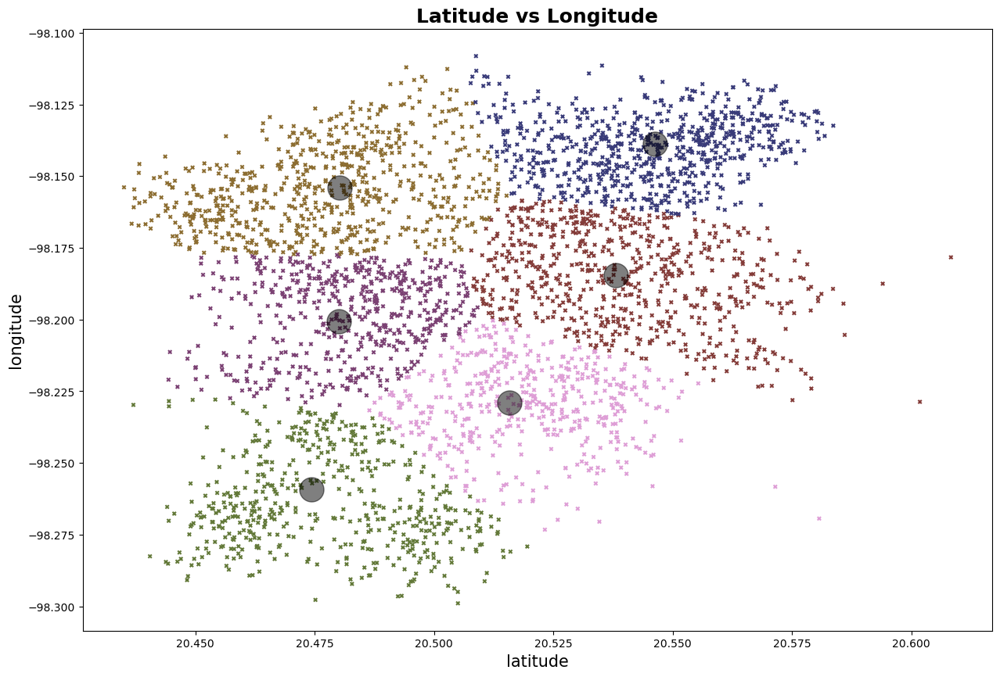

In [671]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=0, max_iter=1000)
X=df[['lat','lon']].values
Y=df['Vol_Entrega']*df['Frecuencia'].values
wt_kmeansclus = kmeans.fit(X,sample_weight = Y)
predicted_kmeans = kmeans.predict(X, sample_weight = Y)
plt.style.use('default')
plt.figure(figsize=(15, 10))
plt.scatter(X[:,0], X[:,1], c=wt_kmeansclus.labels_.astype(float),s=10,cmap='tab20b',marker='x')
plt.title('Latitude vs Longitude',fontsize=18, fontweight='bold')
plt.xlabel('latitude',fontsize=15)
plt.ylabel('longitude',fontsize=15)
centers = wt_kmeansclus.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=500, alpha=0.5);

In [672]:
df2=df
df2['Cluster']=predicted_kmeans
df2[['Cluster','Vol_Entrega']].groupby(['Cluster']).sum()

,Vol_Entrega
Cluster,
0,8078.000000
1,7292.166667
2,9671.000000
3,8083.500000
4,8818.000000
5,5891.833333


In [673]:
df2[['Cluster','Vol_Entrega']].groupby(['Cluster']).count()

,Vol_Entrega
Cluster,
0,720
1,528
2,694
3,666
4,539
5,478


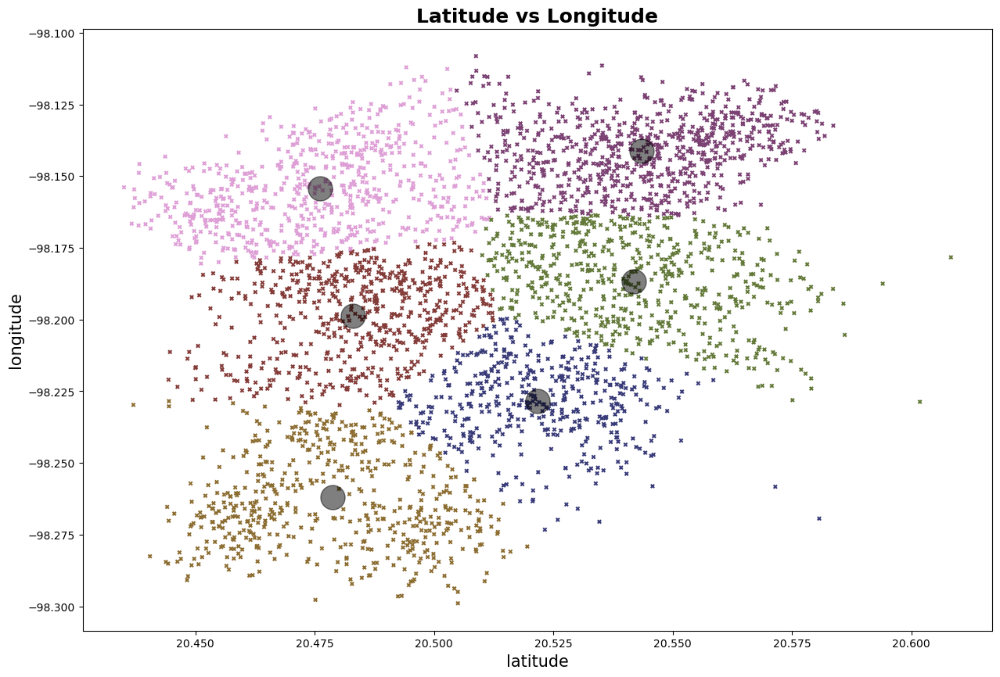

In [668]:
kmeans = KMeans(n_clusters=6, random_state=0, max_iter=1000)
X=df[['lat','lon']].values
df['Vol_total']=df['Vol_Entrega']*df['Frecuencia']
Y=df['Frecuencia'].values
wt_kmeansclus = kmeans.fit(X,sample_weight = Y)
predicted_kmeans = kmeans.predict(X, sample_weight = Y)
plt.style.use('default')
plt.figure(figsize=(15, 10))
plt.scatter(X[:,0], X[:,1], c=wt_kmeansclus.labels_.astype(float),s=10,cmap='tab20b',marker='x')
plt.title('Latitude vs Longitude',fontsize=18, fontweight='bold')
plt.xlabel('latitude',fontsize=15)
plt.ylabel('longitude',fontsize=15)
centers = wt_kmeansclus.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=500, alpha=0.5);

In [669]:
df2['Cluster']=predicted_kmeans
df2[['Cluster','Vol_Entrega']].groupby(['Cluster']).sum()

,Vol_Entrega
Cluster,
0,5260.333333
1,7355.500000
2,7764.666667
3,9534.500000
4,8798.500000
5,9121.000000


In [670]:
df2[['Cluster','Vol_Entrega']].groupby(['Cluster']).count()

,Vol_Entrega
Cluster,
0,445
1,594
2,556
3,588
4,777
5,665


### Vamos a ver otro modelo de clusterization DBSCAN

Text(0, 0.5, 'longitude')

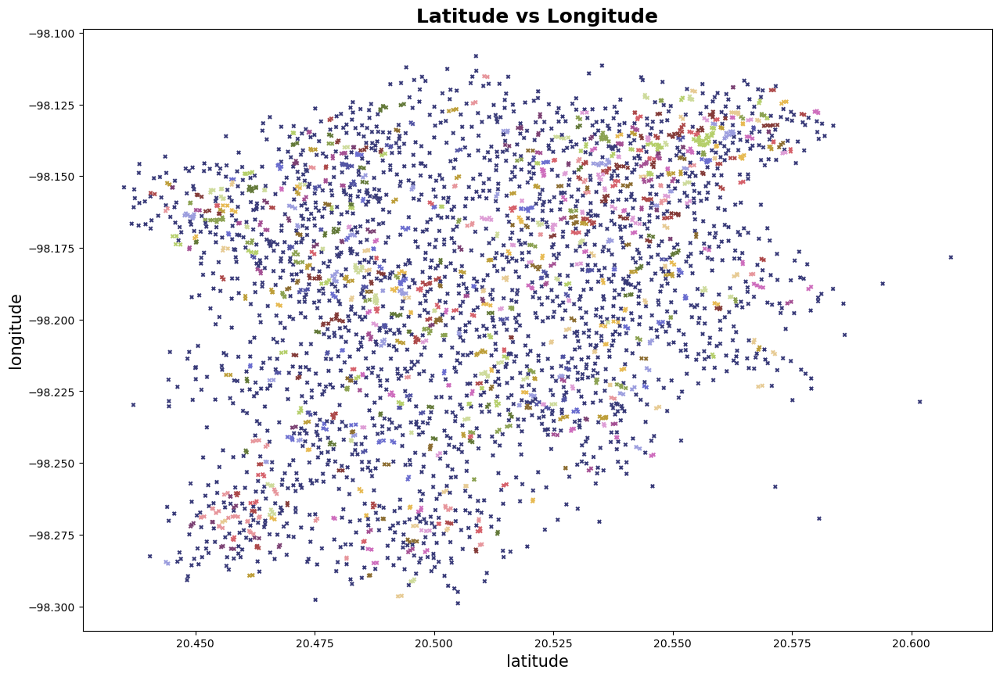

In [448]:
from sklearn.cluster import DBSCAN
X=df[['lat','lon']].values
df['Vol_total']=df['Vol_Entrega']*df['Frecuencia']
Y=df['Frecuencia'].values
clustering = DBSCAN(eps=0.001, min_samples=2).fit(X,Y)
plt.style.use('default')
plt.figure(figsize=(15, 10))
plt.scatter(X[:,0], X[:,1], c=clustering.labels_.astype(float),s=10,cmap='tab20b',marker='x')
plt.title('Latitude vs Longitude',fontsize=18, fontweight='bold')
plt.xlabel('latitude',fontsize=15)
plt.ylabel('longitude',fontsize=15)

In [597]:
def mstep(X: np.ndarray, post: np.ndarray,weight=0):
    """M-step: Updates the gaussian mixture. Each cluster
    yields a component mean and variance.

    Args: X: (n, d) array holding the data
        post: (n, K) array holding the soft counts
            for all components for all examples

    Returns:
        GaussianMixture: the new gaussian mixture
        float: the distortion cost for the current assignment
    """
    n, d = X.shape
    _, K = post.shape
    

    n_hat = (post*Y).sum(axis=0)
    p = n_hat / n

    cost = 0
    centroid = np.zeros((K, d))
    
    for j in range(K):
        centroid[j, :] = post[:, j] @(X*Y) / n_hat[j]
        sse = ((centroid[j] - X)**2).sum(axis=1) @ post[:, j]
        cost += sse
    return centroid, cost

In [588]:
(post*Y).shape

(3625, 6)

In [596]:
Y=df['Vol_total'].values.reshape(X.shape[0],1)/np.max(df['Vol_total'])+\
df['Frecuencia'].values.reshape(X.shape[0],1)/np.max(df['Frecuencia'])
(post*Y).shape

(3625, 6)

In [577]:
def run(X=0, centroid=0,frecuencia=0,weight=0):
    """Runs the mixture model

    Args:
        X: (n, d) array holding the data
        post: (n, K) array holding the soft counts
            for all components for all examples

    Returns:
        GaussianMixture: the new gaussian mixture
        np.ndarray: (n, K) array holding the soft counts
            for all components for all examples
        float: distortion cost of the current assignment
    """

    prev_cost = None
    cost = None
    while (prev_cost is None or prev_cost - cost > 1e-10):
        prev_cost = cost
        post = estep(X, centroid,frecuencia)
        centroid, cost = mstep(X, post,weight)

    return centroid, post, cost

In [578]:
post = estep(X, initial,f)

In [579]:
post[:, 2] @(X*Y)

array([  24623.769418, -117988.601192])

In [549]:
post[:, 0]

array([1., 0., 0., ..., 0., 0., 0.])

In [543]:
(X*Y)

array([[   41.012104,  -196.424754],
       [  347.788176, -1669.761216],
       [   41.060854,  -196.47372 ],
       ...,
       [  123.0552  ,  -588.768   ],
       [  635.9154  , -3042.7895  ],
       [  759.305564, -3632.149733]])

In [554]:
Y

array([[0.01142857],
       [0.09714286],
       [0.01142857],
       ...,
       [0.03428571],
       [0.17714286],
       [0.21142857]])

In [563]:
Y=df['Vol_total'].values.reshape(X.shape[0],1)/np.max(df['Vol_total'])
Y

array([[0.01142857],
       [0.09714286],
       [0.01142857],
       ...,
       [0.03428571],
       [0.17714286],
       [0.21142857]])

In [564]:
X

array([[ 20.506052, -98.212377],
       [ 20.458128, -98.221248],
       [ 20.530427, -98.23686 ],
       ...,
       [ 20.5092  , -98.128   ],
       [ 20.5134  , -98.1545  ],
       [ 20.521772, -98.166209]])

In [565]:
X*Y

array([[  0.23435488,  -1.12242717],
       [  1.98736101,  -9.54149266],
       [  0.23463345,  -1.12270697],
       ...,
       [  0.70317257,  -3.36438857],
       [  3.63380229, -17.38736857],
       [  4.33888894, -20.75514133]])

In [607]:
def normalize(v,ord=None):
    norm = np.linalg.norm(v,ord)
    if norm == 0: 
       return v
    return v / norm

In [659]:
import matplotlib.pyplot as plt 
import sys 
   
# function to plot the selected centroids 
def plot(data, centroids): 
    plt.scatter(data[:, 0], data[:, 1], marker = '.',  
                color = 'gray', label = 'data points') 
    plt.scatter(centroids[:-1, 0], centroids[:-1, 1],  
                color = 'black', label = 'previously selected centroids') 
    plt.scatter(centroids[-1, 0], centroids[-1, 1],  
                color = 'red', label = 'next centroid') 
    plt.title('Select % d th centroid'%(centroids.shape[0])) 
      
    plt.legend() 
    plt.show() 
           
# function to compute euclidean distance 
def distance(p1, p2): 
    return np.sum((p1 - p2)**2) 
   
# initialization algorithm 
def initialize(data, k): 
    ''' 
    initialized the centroids for K-means++ 
    inputs: 
        data - numpy array of data points having shape (200, 2) 
        k - number of clusters  
    '''
    ## initialize the centroids list and add 
    ## a randomly selected data point to the list 
    centroids = [] 
    centroids.append(data[np.random.randint( 
            data.shape[0]), :]) 
    #plot(data, np.array(centroids)) 
   
    ## compute remaining k - 1 centroids 
    for c_id in range(k - 1): 
          
        ## initialize a list to store distances of data 
        ## points from nearest centroid 
        dist = [] 
        for i in range(data.shape[0]): 
            point = data[i, :] 
            d = sys.maxsize 
              
            ## compute distance of 'point' from each of the previously 
            ## selected centroid and store the minimum distance 
            for j in range(len(centroids)): 
                temp_dist = distance(point, centroids[j]) 
                d = min(d, temp_dist) 
            dist.append(d) 
              
        ## select data point with maximum distance as our next centroid 
        dist = np.array(dist) 
        next_centroid = data[np.argmax(dist), :] 
        centroids.append(next_centroid) 
        dist = [] 
        #plot(data, np.array(centroids)) 
    return centroids 
   
# call the initialize function to get the centroids 
centroids = initialize(data, k = 4) 

In [666]:
X=df[['lat','lon']].values
initial=np.array(initialize(X, k = 6) )
df['Vol_total']=df['Vol_Entrega']*df['Frecuencia']
#Ponderando con el max value
#Y=df['Vol_total'].values.reshape(X.shape[0],1)/np.max(df['Vol_total'])+\
#df['Frecuencia'].values.reshape(X.shape[0],1)/np.max(df['Frecuencia'])
#Solo metiendo como weight el peso
#Y=df['Vol_total'].values.reshape(X.shape[0],1)
#Metiendo como weight la frecuencia
#Y=df['Vol_total'].values.reshape(X.shape[0],1)
#Normalizando
Y=normalize(df['Vol_total'].values.reshape(X.shape[0],1),1)+\
normalize(df['Frecuencia'].values.reshape(X.shape[0],1),1)
f=df['Frecuencia'].values
centroid,post,cost=run(X,initial,f,Y)
zone=df
zone['D1']=post[:,0]
zone['D2']=post[:,1]
zone['D3']=post[:,2]
zone['D4']=post[:,3]
zone['D5']=post[:,4]
zone['D6']=post[:,5]
#Vamos a expxortar el csv
zone[['Id_Cliente','D1','D2','D3','D4','D5','D6']].to_csv(r'C:\Users\Jose Juarez\Documents\GitHub\Modelo_Hackathon\Output\norm.csv', index = False)
#Vamos a verlo visualmente
zone['Cluster']=np.argmax(post,axis=1)
zone=zone.melt(id_vars=['Id_Cliente', 'id_Agencia', 'Frecuencia', 'Vol_Entrega', 'lat', 'lon','Vol_total',
       'Multiple', 'Cluster'], 
        var_name="Agrupación", 
        value_name="Value")
zone=zone[zone['Value']!=0]
print(zone[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).sum())
print(zone[['Agrupación','Vol_Entrega']].groupby(['Agrupación']).count())
map_Zonas = folium.Map(location=[20.506052, -98.212377], zoom_start=12)
markers_colors = []
i=0
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
for lat, lon, cluster in zip(zone['lat'], zone['lon'],zone['Cluster']):
    
    #i=i+1
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Zonas)
    #if i==6:
        #break
map_Zonas

             Vol_Entrega
Agrupación              
D1           8929.166667
D2          10449.166667
D3           8943.666667
D4           7757.333333
D5          11115.666667
D6           7205.000000
            Vol_Entrega
Agrupación             
D1                  627
D2                  870
D3                  613
D4                  691
D5                  674
D6                  502
